In [1]:
import sys
sys.path.append('../')
import pdb
import pycm
from glob import glob
import torch
from torch import nn
import cv2
import os
from PIL import Image
from skimage import io, transform
import matplotlib.pyplot as plt
import seaborn as sn
from models import Model
import matplotlib.image as mpimg
import pandas as pd
from torchvision.datasets.folder import pil_loader
import random
import numpy as np
from torchsummary import summary
import pretrainedmodels
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import *
from tensorboard_logger import * 
from dataloader import *
from submission import *
from albumentations import torch as AT
from pycm import *
os.environ['CUDA_VISIBLE_DEVICES']=""
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

#### The notebook can be used to analyse predictions of trained models on train set. Test set predictions of two models can also be compared.
See, we can compare the cm obj files saved for train and val for each epoch but dude the dataloader is doing weighted sampling, we don't actually get to see the predictions on the real training set, so yeah let them be for logger.py

In [2]:
def get_uniques(path):
    '''takes predicted csv's and returns unique counts'''
    pred = pd.read_csv(path)
    print(np.unique(pred.diagnosis.values, return_counts=True))

# def get_preds(pred, threshold):
#     '''pred: [nx5], threshold: float'''
#     y1 = pred > threshold
#     y1 = np.clip(y1.astype(int).sum(axis=1) - 1, 0, 4)
#     return y1

def get_preds(arr, threshold, num_cls=5):
    """ takes in thresholded predictions (num_samples, num_cls) and returns (num_samples,)
    [3], arr needs to be a numpy array, NOT torch tensor"""
    arr = arr > threshold
    mask = arr == 0
    # pdb.set_trace()
    return np.clip(np.where(mask.any(1), mask.argmax(1), num_cls) - 1, 0, num_cls - 1)


def predict(X, coef):
    # [0.15, 2.4, ..] -> [0, 2, ..]
    X_p = np.copy(X)
    for i, pred in enumerate(X_p):
        if pred < coef[0]:
            X_p[i] = 0
        elif pred >= coef[0] and pred < coef[1]:
            X_p[i] = 1
        elif pred >= coef[1] and pred < coef[2]:
            X_p[i] = 2
        elif pred >= coef[2] and pred < coef[3]:
            X_p[i] = 3
        else:
            X_p[i] = 4
    return X_p.astype('int')



In [3]:
get_uniques('../weights/submission713.csv') 
get_uniques('../weights/submission736.csv') 
get_uniques('../weights/submission73.csv') 
get_uniques('../weights/submission785.csv') 
get_uniques('../weights/submission812.csv') 

(array([0, 1, 2, 3, 4]), array([227, 416, 931, 316,  38]))
(array([0, 1, 2, 3, 4]), array([292, 344, 998, 229,  65]))
(array([0, 1, 2, 3, 4]), array([ 301,  227, 1002,  345,   53]))
(array([0, 1, 2, 3, 4]), array([ 292,  180, 1178,  220,   58]))
(array([0, 1, 2, 3, 4]), array([ 331,  195, 1145,  193,   64]))


### Load predicted test npy files and compute the optimized threshold using the best public submission.csv

In [83]:
#npy_folder = '../weights/15-7_resnext101_32x4d_v0_fold0_bgcpold256/test_npy/'
#npy_folder = '../weights/17-7_resnext101_32x4d_v0_fold0_bgcpcold256reg/test_npy/'
#npy_folder = '../weights/18-7_resnext101_32x16d_fold0_bgccpold/test_npy/'
npy_folder = '../weights/168_efficientnet-b5_f1_poma/test_npy/'
files = glob(os.path.join(npy_folder, '*.npy'))
preds = {}
for file in files:
    ep = file.split('/')[-1]
    preds[ep] = np.load(file)
#preds.keys()

In [82]:
y_test = pd.read_csv('../weights/submission820.csv')['diagnosis'].values.reshape(-1, 1)
y_test1 = pd.read_csv('../weights/submission812.csv')['diagnosis'].values.reshape(-1, 1)
np.unique(y_test, return_counts=True)

(array([0, 1, 2, 3, 4]), array([ 357,  136, 1248,  112,   75]))

In [48]:
cohen_kappa_score(y_test1, y_test, weights="quadratic"), accuracy_score(y_test, y_test1)

(0.9579769465144451, 0.921161825726141)

In [49]:
def compute_dist(threshold, pred):
    y1 = get_preds(pred, threshold)
    #distance = np.mean((y1 - y_test)**2)
    score = cohen_kappa_score(y1, y_test, weights='quadratic')
    return 1 - score

def get_optimised_threshold(pred):
    '''old'''
    initial_coeffs = np.array([0.5, 0.5, 0.5, 0.5, 0.5])
    simplex = scipy.optimize.minimize(
        compute_dist, initial_coeffs, args=(pred,), method='nelder-mead'
    )
    best_threshold = simplex['x']
    return best_threshold

for key in sorted(preds.keys(), key=lambda x: int(x.split('.')[0][9:])):
    pred, val_bt = preds[key]# val_bt = validation best threhsold
    #best_threshold = get_optimised_threshold(pred)
    best_threshold = val_bt
#     best_threshold = np.array([0.5, 1.5, 2.5, 3.3])
    base_threshold = np.array([0.5, 1.5, 2.5, 3.5])
    #print(f"\nval best thr: {val_bt}")
    print(f'\n{key}: {best_threshold}')
    pred1 = predict(pred, best_threshold)
    pred2 = predict(pred, base_threshold)
    score = cohen_kappa_score(y_test, pred1, weights="quadratic")
    acc = accuracy_score(y_test, pred1)
#     print('best:', np.unique(pred1, return_counts=True)[1])
#     print(f'best score: {score}, acc: {acc}')
#     print('*' * 10)
    score = cohen_kappa_score(y_test, pred2, weights="quadratic")
    acc = accuracy_score(y_test, pred2)
    print('base:', np.unique(pred2, return_counts=True)[1])
    print(f'base score: {score}, acc: {acc}')



test_ckpt0.npy: [0.53376122 1.45461617 2.44616318 3.35284843]
base: [ 352  208 1147  172   49]
base score: 0.8576395429693041, acc: 0.7935684647302904

test_ckpt1.npy: [0.50482441 1.55678356 2.34376782 3.59042643]
base: [ 353  243 1134  151   47]
base score: 0.8723376328107237, acc: 0.8086099585062241

test_ckpt2.npy: [0.48671875 1.53046875 2.60546875 3.4015625 ]
base: [ 355  235 1100  191   47]
base score: 0.8841279517822841, acc: 0.8112033195020747

test_ckpt3.npy: [0.54577558 1.472927   2.28272235 3.37875006]
base: [ 355  260 1121  146   46]
base score: 0.8830346696802662, acc: 0.8163900414937759

test_ckpt4.npy: [0.52238693 1.46607285 2.58272934 3.37501984]
base: [ 357  263 1072  186   50]
base score: 0.8884764098556209, acc: 0.8101659751037344

test_ckpt5.npy: [0.49710747 1.52353681 2.44974739 3.66691269]
base: [ 350  246 1063  216   53]
base score: 0.8931701348603789, acc: 0.8122406639004149

test_ckpt6.npy: [0.51202155 1.42271202 2.37294847 3.60361506]
base: [ 354  277 1043  20

In [108]:
ensemble = pd.read_csv('../weights/168_efficientnet_poma_ensemble.csv')
np.unique(ensemble['diagnosis'], return_counts=True)

(array([0, 1, 2, 3, 4]), array([ 348,  259, 1032,  224,   65]))

In [120]:
test_classifier_preds = np.load('../classifier/weights/17-8_efficientnet-b5_f0_focalsamp/test_npy/test_ckpt29.npy')
cls_preds = (test_classifier_preds > 0.5).astype('uint8').flatten()
print('total:', np.sum(cls_preds))
print(ensemble.iloc[np.where(cls_preds == 1)]['diagnosis'].value_counts())

total: 46
4    33
3     9
2     3
1     1
Name: diagnosis, dtype: int64


In [99]:
diff = ensemble.iloc[np.where(cls_preds == 1)]#.query('diagnosis==3')
diff.head()

,id_code,diagnosis
172,1927c7ed6570,4
221,219828b94b41,4
266,28079fa5dac3,3
277,2936da8f3f2a,4
357,3393ee9e7f29,3


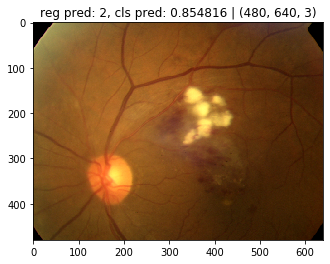

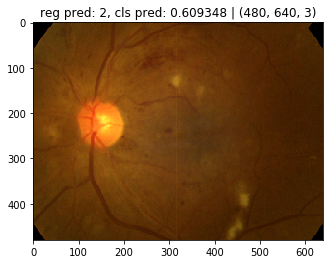

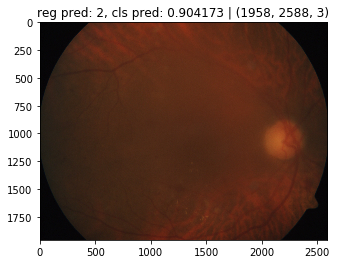

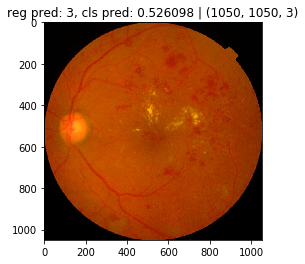

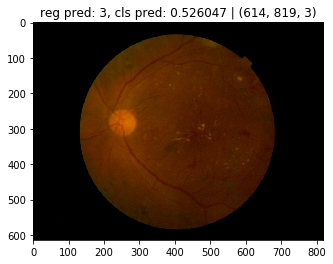

...

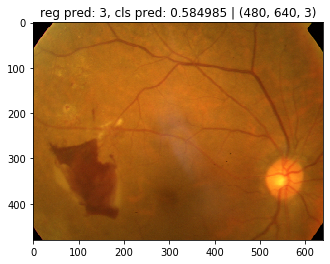

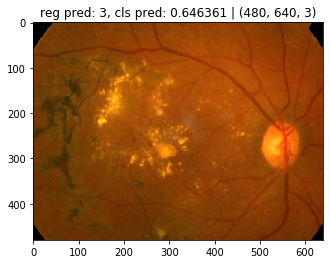

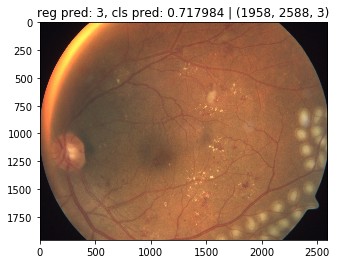

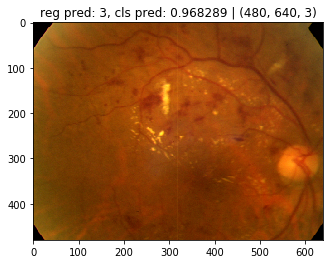

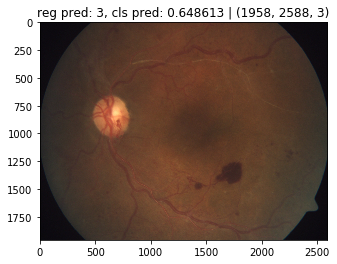

In [105]:
#fig = plt.figure(figsize=(25, 16))
IMG_SIZE=300
for class_id in sorted([0, 1, 2, 3]):
    samples = len(diff[diff['diagnosis'] == class_id])
    if samples == 0: continue
    for i, (idx, row) in enumerate(diff.loc[diff['diagnosis'] == class_id].sample(samples, random_state=69).iterrows()):
        path=f"../data/test_images/{row['id_code']}.png"
        image = cv2.imread(path)
        #print(image.shape)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    #     image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        #image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128) # the trick is to add this line
        plt.imshow(image)
        prob = test_classifier_preds[idx]#[row.index.values]
        plt.title('reg pred: %d, cls pred: %f | %s' % (class_id, prob, image.shape) )
        plt.show()

In [106]:
ensemble.at[np.where(cls_preds == 1)[0].tolist(), 'diagnosis'] = 4

In [107]:
np.unique(ensemble['diagnosis'], return_counts=True)

(array([0, 1, 2, 3, 4]), array([ 348,  259, 1029,  214,   78]))

In [93]:
cohen_kappa_score(y_test, ensemble['diagnosis'].values, weights="quadratic"), accuracy_score(y_test, ensemble['diagnosis'].values)

(0.8968362475266122, 0.8137966804979253)

In [94]:
ensemble.to_csv('../weights/168_efficientnet_poma_ensemble_withcls.csv', index=False)

(0.8933797138662324, 0.8117219917012448)

In [55]:
ckpt_path = '../weights/168_efficientnet-b5_f1_poma/test_npy/test_ckpt14.npy'
sub_path = ckpt_path.replace('test_npy/', '').replace('.npy', '.csv')
raw_preds = np.load(ckpt_path)[0]
base_thresholds = [0.5, 1.5, 2.5, 3.5]
df_preds = predict(raw_preds, base_thresholds)
print(np.unique(df_preds, return_counts=True))
df = pd.read_csv('../data/sample_submission.csv')
df.loc[:, 'diagnosis'] = df_preds
df.to_csv(sub_path, index=False)

(array([0, 1, 2, 3, 4]), array([ 350,  254, 1031,  230,   63]))


In [44]:
df.diagnosis.head()

0    2
1    3
2    2
3    2
4    2
Name: diagnosis, dtype: int64

In [166]:
pred, th = preds['test_ckpt17.npy']
best_threshold = [0.5, 1.5, 2.5, 3.5]
pred_ = predict(pred, best_threshold)
print(np.unique(pred_, return_counts=True))
pred_ = predict(pred, th)
print(np.unique(pred_, return_counts=True))


KeyError: 'test_ckpt17.npy'

### Analysis of model on train/val using cm obj files

In [167]:
train_cm = ConfusionMatrix(file=open('../weights/118_efficientnet-b5_f1_postraug2/logs/base_cmtrain_16.obj', 'r'))
val_cm = ConfusionMatrix(file=open('../weights/118_efficientnet-b5_f1_postraug2/logs/base_cmval_16.obj', 'r'))

In [169]:
#train_cm.predict_vector

In [170]:
train_cm.print_matrix()

Predict    0          1          2          3          4          
Actual
0          1883       82         2          0          0          

1          85         188        172        4          2          

2          14         99         806        133        1          

3          0          5          167        214        23         

4          0          1          45         109        76         




In [171]:
val_cm.print_matrix()

Predict   0         1         2         3         4         
Actual
0         344       3         0         0         0         

1         5         25        33        1         0         

2         1         22        137       13        1         

3         0         0         25        4         8         

4         0         0         8         13        32        




Effnet fold1, ckpt10 is my best performing model so far. LB: 0.812, 
Things to notice:
* Val thresholds optimized were used for val metric val_cm.

In [10]:
val_cm.overall_stat

{'Overall ACC': 0.7969465648854962,
 'Kappa': 0.6912228094240578,
 'Overall RACC': 0.3423949653283608,
 'SOA1(Landis & Koch)': 'Substantial',
 'SOA2(Fleiss)': 'Intermediate to Good',
 'SOA3(Altman)': 'Good',
 'SOA4(Cicchetti)': 'Good',
 'SOA5(Cramer)': 'Strong',
 'SOA6(Matthews)': 'Moderate',
 'TPR Macro': 0.6311902383922033,
 'PPV Macro': 0.6865924424290046,
 'ACC Macro': 0.9187786259541983,
 'F1 Macro': 0.6515875767370725,
 'TPR Micro': 0.7969465648854962,
 'PPV Micro': 0.7969465648854962,
 'F1 Micro': 0.7969465648854962,
 'Scott PI': 0.6908869944734718,
 'Gwet AC1': 0.7570484093907909,
 'Bennett S': 0.7461832061068702,
 'Kappa Standard Error': 0.023901986262936624,
 'Kappa 95% CI': (0.644374916348702, 0.7380707024994135),
 'Chi-Squared': 1028.5943993206718,
 'Phi-Squared': 1.57037312873385,
 'Cramer V': 0.6265726471714692,
 'Chi-Squared DF': 16,
 '95% CI': (0.7661391545353836, 0.8277539752356088),
 'Standard Error': 0.015718066505159483,
 'Response Entropy': 1.788741071801734,
 'Ref

In [172]:
np.mean(list(val_cm.class_stat['TPR'].values()))

0.5762434963423276

In [173]:
cm = val_cm
cm.matrix

{0: {0: 344, 1: 3, 2: 0, 3: 0, 4: 0},
 1: {0: 5, 1: 25, 2: 33, 3: 1, 4: 0},
 2: {0: 1, 1: 22, 2: 137, 3: 13, 4: 1},
 3: {0: 0, 1: 0, 2: 25, 3: 4, 4: 8},
 4: {0: 0, 1: 0, 2: 8, 3: 13, 4: 32}}

In [174]:
cm.TP, cm.FP, cm.TN, cm.FN

({0: 344, 1: 25, 2: 137, 3: 4, 4: 32},
 {0: 6, 1: 25, 2: 66, 3: 27, 4: 9},
 {0: 322, 1: 586, 2: 435, 3: 611, 4: 613},
 {0: 3, 1: 39, 2: 37, 3: 33, 4: 21})

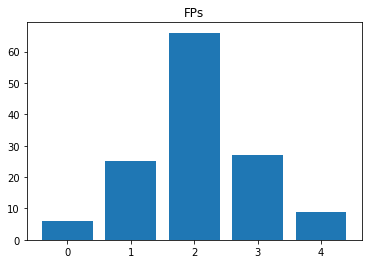

In [175]:
plt.bar(cm.FP.keys(), cm.FP.values())
plt.title('FPs');

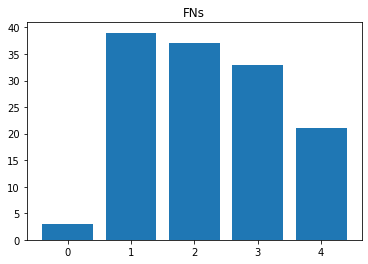

In [176]:
plt.bar(cm.FN.keys(), cm.FN.values())
plt.title('FNs');

### Let's plot some mispredictions

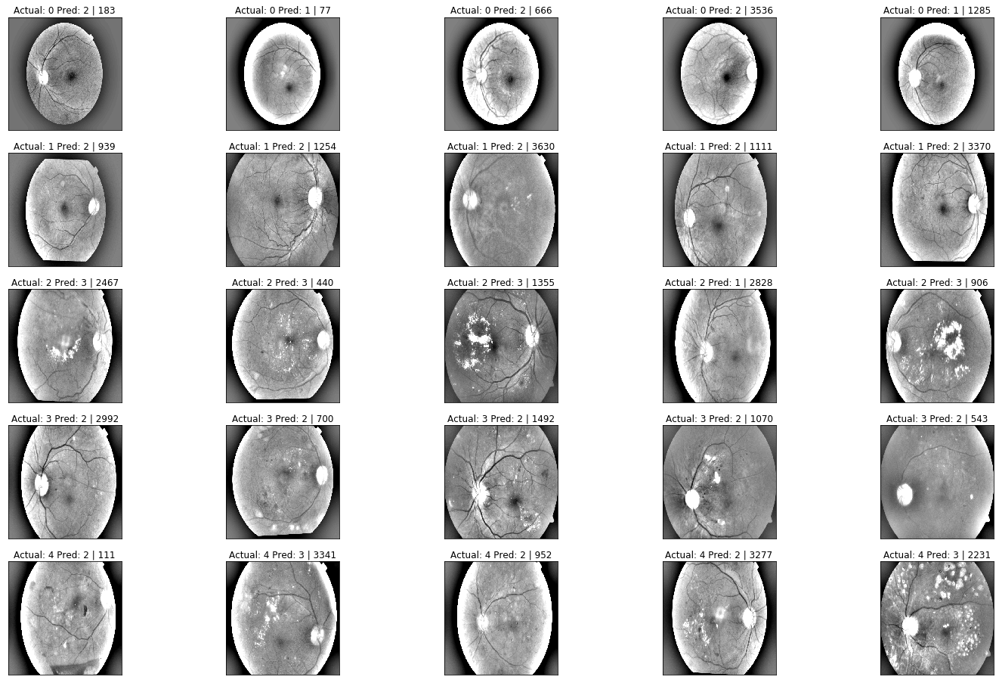

In [18]:
fig = plt.figure(figsize=(25, 16))
IMG_SIZE=512
for class_id in sorted(diff['actual'].unique()):
    samples = len(diff[diff['actual'] == class_id])
    samples = 5 if samples > 5 else samples # make sure there are atleast 5 predictions to plot or go for whatever is available
    for i, (idx, row) in enumerate(diff.loc[diff['actual'] == class_id].sample(samples, random_state=69).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"../data/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128) # the trick is to add this line
        plt.imshow(image, cmap='gray')
        ax.set_title('Actual: %d Pred: %d | %s' % (class_id, row['pred'], idx) )

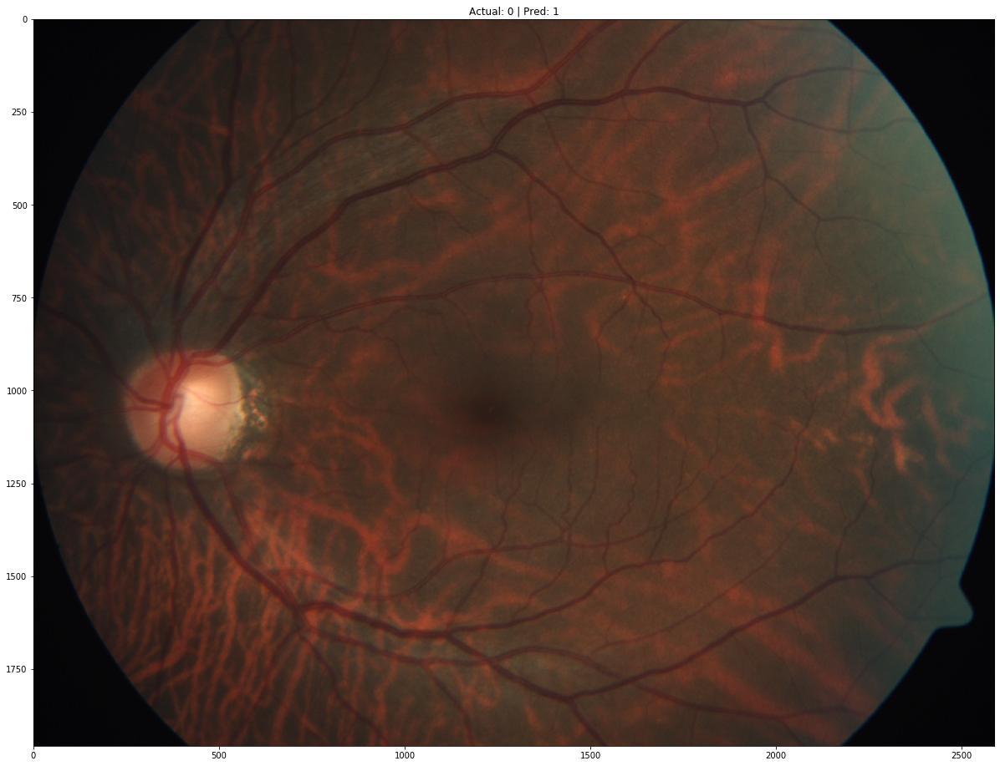

In [86]:
#i = 1546 
i = 494
#img = mpimg.imread() # remember the indices of diff are same as df
path = '../data/train_images/' + df.iloc[i]['id_code'] + '.png'
image = cv2.imread(path)
#image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
#|image=cv2.addWeighted (image, 4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128) # the trick is to add this line
fig = plt.figure(figsize=(25, 16))
#plt.imshow(image, cmap='gray')
plt.imshow(image, )
plt.title("Actual: %d | Pred: %d" % (df.iloc[i]['actual'], df.iloc[i]['pred']))
plt.show()

#####  https://www.eyeops.com/contents/our-services/eye-diseases/diabetic-retinopathy

In [87]:
image = cv2.resize(image, (IMG_SIZE, IMG_SIZE, 3))


TypeError: function takes exactly 2 arguments (3 given)

### Base model Activation heatmaps

In [9]:
# Visualize feature maps
activation = {}
def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook


In [10]:
model_name = "densenet121"
model = Model(model_name, 5)

In [11]:
model.model.features.norm5.register_forward_hook(get_activation('norm5'))

In [12]:
fold =0
total_folds = 10
images_folder = '../data/train_images/'
df_path = '../data/train.csv'
size = 224
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)
dataloaders = {
    phase: provider(
        fold,
        total_folds,
        images_folder,
        df_path,
        phase,
        size,
        mean,
        std,
        batch_size=1,
        num_workers=1,
    )
    for phase in ["train", "val"]
}

def unnormalize(img):
    mean = torch.as_tensor([0.485, 0.456, 0.406])
    std = torch.as_tensor([0.229, 0.224, 0.225])
    #return (img * std) + mean
    for t, m, s in zip(img, mean, std):    
        t.mul_(s).add_(m)
    return img.permute(1, 2, 0)# * 255

In [51]:
batch = next(iter(dataloaders['train']))

In [52]:
fnames, images, labels = batch
output = model(images) # during forward pass, model populates the activation dictionary using forward hook

In [53]:
act = activation['norm5'] # 1, 1024, 7, 7
mean_act = torch.mean(act[0], 0) # take mean across 1024 channels

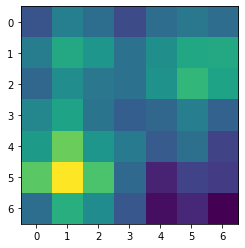

In [54]:
plt.imshow(mean_act, cmap='viridis')

In [55]:
unimage = unnormalize(images[0].clone())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


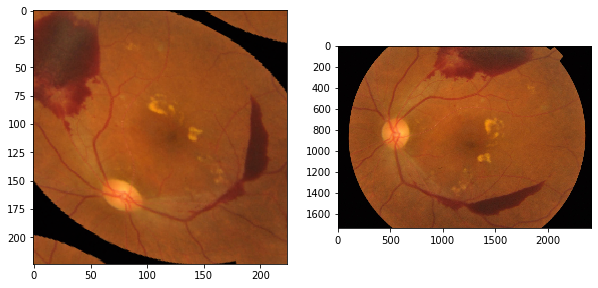

In [63]:
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(unimage);
plt.subplot(1, 2, 2)
plt.imshow(mpimg.imread(f'../data/train_images/{fnames[0]}.png')); 
plt.show(); # original image

In [84]:
torch.max(unimage), torch.min(unimage)

(tensor(0.8902), tensor(0.))

In [87]:
torch.max(images), torch.min(images)

(tensor(1.7694), tensor(-2.1179))

### Where's model failing? Hard examples? Analysing train set

It's utmost important to analyse the predictions on train and val set seperately

In [15]:
# npy files created with test.py

train_pred, best_thresholds = np.load('../weights/21-7_efficientnet-b5_fold1_bgccpo300aug2/train_npy/train_ckpt15.npy')
#train_pred, best_thresholds = np.load('../weights/24-7_efficientnet-b5_fold1_poscwwd/train_npy/train_ckpt29.npy')
# train_pred, best_thresholds = np.load('../weights/128_efficientnet-b5_f1_postraugs/train_npy/train_ckpt16.npy')
base_th = [0.5, 1.5, 2.5, 3.5]
train_bestpred = predict(train_pred, best_thresholds)
train_basepred = predict(train_pred, base_th)

In [16]:
# train_df = pd.read_csv('../data/train.csv')
# train_df['diagnosis'] = train_basepred
# train_df.to_csv('../weights/118_efficientnet-b5_f1_postraug2/train_ckpt16.csv', index=False)

In [17]:
#train_df = pd.read_csv('../data/train_messidor.csv')
train_df = pd.read_csv('../data/train.csv')
train_df['bestpred'] = train_bestpred
train_df['basepred'] = train_basepred
train_df['dist'] = abs(train_df['bestpred']-train_df['diagnosis'])

In [29]:
path = '../weights/ensemble/168_efficientnet-b5_poma/'
raw_train = np.load(os.path.join(path + 'train.npy'))
mean_preds = np.mean(raw_train, axis=0)
base_threshold = [0.4, 1.5, 2.5, 3.0]
preds = predict(mean_preds, base_threshold)
train_df = pd.read_csv('../data/train.csv')
train_df['basepred'] = preds

In [30]:
train_df.head()

,id_code,diagnosis,basepred
0,000c1434d8d7.png,2,2
1,001639a390f0.png,4,4
2,0024cdab0c1e.png,1,1
3,002c21358ce6.png,0,0
4,005b95c28852.png,0,0


In [31]:
cm = ConfusionMatrix(train_df['diagnosis'].values, train_df['basepred'].values)

In [32]:
cm.print_matrix()

Predict    0          1          2          3          4          
Actual
0          1781       24         0          0          0          

1          32         215        120        1          2          

2          1          119        802        64         13         

3          0          1          71         66         55         

4          0          6          63         31         195        




In [33]:
cm.print_normalized_matrix()

Predict       0             1             2             3             4             
Actual
0             0.9867        0.0133        0.0           0.0           0.0           

1             0.08649       0.58108       0.32432       0.0027        0.00541       

2             0.001         0.11912       0.8028        0.06406       0.01301       

3             0.0           0.00518       0.36788       0.34197       0.28497       

4             0.0           0.02034       0.21356       0.10508       0.66102       




In [34]:
# qwk in bestpred, basepred
print('qwk:', cohen_kappa_score(train_df['basepred'].values, train_df['diagnosis'].values, weights="quadratic" ))
print('acc:', accuracy_score(train_df['basepred'].values, train_df['diagnosis'].values))

qwk: 0.9249314122427055
acc: 0.8353358820316766


In [7]:
# print('best qwk:', cohen_kappa_score(train_df['bestpred'].values, train_df['diagnosis'].values, weights="quadratic" ))
print('base qwk:', cohen_kappa_score(train_df['basepred'].values, train_df['diagnosis'].values, weights="quadratic" ))

base qwk: 0.9238641003722018


In [8]:
base_diff = train_df.query("diagnosis != basepred")
# best_diff = train_df.query("diagnosis != bestpred")

In [9]:
train_df.shape, base_diff.shape, #best_diff.shape # base_diff > best_diff means best_thresholds is better

((3662, 3), (614, 3))

In [10]:
diff = base_diff.copy()
diff['pred'] = diff['basepred']
diff = diff.drop(columns=['basepred'])

In [11]:
print('diff qwk:', cohen_kappa_score(diff['pred'].values, diff['diagnosis'].values, weights="quadratic" ))

diff qwk: 0.3978886680443854


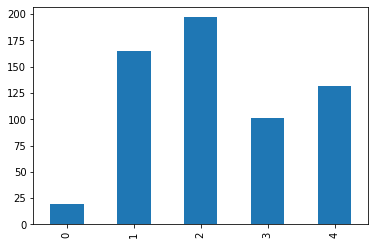

In [12]:
diff['diagnosis'].value_counts(sort=False).plot('bar');

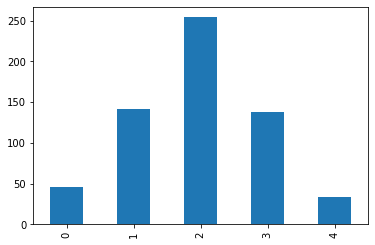

In [13]:
diff['pred'].value_counts(sort=False).plot('bar');

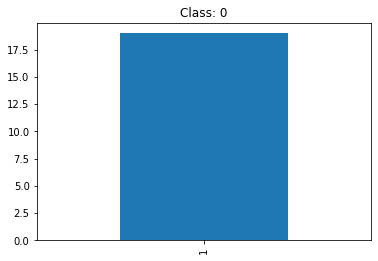

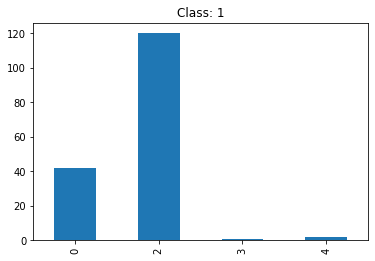

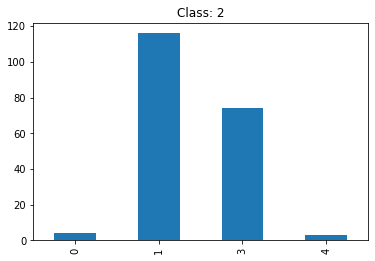

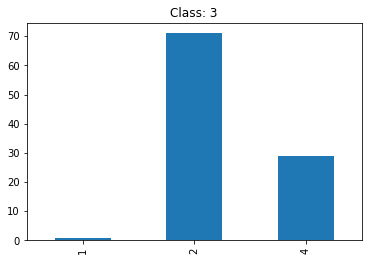

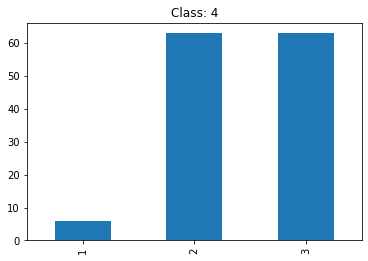

In [14]:
for i in range(5): diff[diff['diagnosis']==i]['pred'].value_counts(sort=False).plot(kind="bar", title=f'Class: {i}'); plt.show()

In [15]:
cm = ConfusionMatrix(diff['diagnosis'].values, diff['pred'].values)

In [17]:
cm.print_matrix()

Predict   0         1         2         3         4         
Actual
0         0         19        0         0         0         

1         42        0         120       1         2         

2         4         116       0         74        3         

3         0         1         71        0         29        

4         0         6         63        63        0         




In [18]:
diff.head()

,id_code,diagnosis,pred
2,0024cdab0c1e.png,1,0
13,0104b032c141.png,3,2
16,012a242ac6ff.png,2,1
20,0180bfa26c0b.png,2,3
23,01c7808d901d.png,2,3


array([0, 0, 0, ..., 0, 0, 0])

In [76]:
from collections import defaultdict
train_sizes_counts = defaultdict(int) 
train_size2class = defaultdict(list)
for idx, row in tqdm(train_df.iterrows()):
    path = '../data/all_images/' + row.id_code
    img = cv2.imread(path)
    train_sizes_counts[img.shape] += 1
    train_size2class[img.shape].append(row.diagnosis)
train_size2class = {x: np.unique(train_size2class[x], return_counts=True)[1] for x in train_size2class}

3662it [03:37, 16.86it/s]


In [81]:
train_sizes_counts

defaultdict(int,
            {(2136, 3216, 3): 410,
             (1736, 2416, 3): 638,
             (1050, 1050, 3): 974,
             (1536, 2048, 3): 351,
             (2588, 3388, 3): 141,
             (1958, 2588, 3): 533,
             (614, 819, 3): 287,
             (1000, 1504, 3): 92,
             (1226, 1844, 3): 61,
             (2848, 4288, 3): 52,
             (480, 640, 3): 42,
             (1944, 2896, 3): 34,
             (1424, 2144, 3): 28,
             (1117, 1476, 3): 14,
             (358, 474, 3): 2,
             (1764, 2146, 3): 1,
             (1110, 1467, 3): 2})

In [82]:
train_size2class

{(2136, 3216, 3): array([  2,  13, 307,  32,  56]),
 (1736, 2416, 3): array([ 31, 234, 233,  60,  80]),
 (1050, 1050, 3): array([901,  19,  39,   2,  13]),
 (1536, 2048, 3): array([351]),
 (2588, 3388, 3): array([13, 91,  6, 31]),
 (1958, 2588, 3): array([231,  44, 165,  47,  46]),
 (614, 819, 3): array([279,   7,   1]),
 (1000, 1504, 3): array([ 2, 63,  9, 18]),
 (1226, 1844, 3): array([13, 28,  1, 19]),
 (2848, 4288, 3): array([18, 11,  4, 19]),
 (480, 640, 3): array([33,  5,  4]),
 (1944, 2896, 3): array([ 6,  3, 21,  4]),
 (1424, 2144, 3): array([ 1, 22,  3,  2]),
 (1117, 1476, 3): array([10,  2,  2]),
 (358, 474, 3): array([1, 1]),
 (1764, 2146, 3): array([1]),
 (1110, 1467, 3): array([2])}

In [69]:
from collections import defaultdict
sizes_counts = defaultdict(int) 
size2class = defaultdict(list)
for idx, row in tqdm(diff.iterrows()):
    path = '../data/all_images/' + row.id_code
    img = cv2.imread(path)
    sizes_counts[img.shape] += 1
    size2class[img.shape].append(row.diagnosis)
size2class = {x: np.unique(size2class[x], return_counts=True)[1] for x in size2class}

614it [02:00,  5.09it/s]


In [75]:
size2class 

{(1736, 2416, 3): array([  7, 108,  39,  35,  33]),
 (2136, 3216, 3): array([ 1,  2, 73, 19, 36]),
 (1226, 1844, 3): array([4, 6, 1, 3]),
 (2848, 4288, 3): array([11,  3,  3,  3]),
 (1958, 2588, 3): array([ 2, 21, 33, 14, 20]),
 (1944, 2896, 3): array([ 1, 14,  1]),
 (1424, 2144, 3): array([1, 4, 2, 2]),
 (1000, 1504, 3): array([11,  5, 12]),
 (1050, 1050, 3): array([ 3,  8, 12,  1,  5]),
 (480, 640, 3): array([3, 1, 3]),
 (2588, 3388, 3): array([ 7, 13,  4, 13]),
 (614, 819, 3): array([3, 2]),
 (1117, 1476, 3): array([1, 1]),
 (1764, 2146, 3): array([1]),
 (1536, 2048, 3): array([3])}

In [70]:
sizes_counts

defaultdict(int,
            {(1736, 2416, 3): 222,
             (2136, 3216, 3): 131,
             (1226, 1844, 3): 14,
             (2848, 4288, 3): 20,
             (1958, 2588, 3): 90,
             (1944, 2896, 3): 16,
             (1424, 2144, 3): 9,
             (1000, 1504, 3): 28,
             (1050, 1050, 3): 29,
             (480, 640, 3): 7,
             (2588, 3388, 3): 37,
             (614, 819, 3): 5,
             (1117, 1476, 3): 2,
             (1764, 2146, 3): 1,
             (1536, 2048, 3): 3})

What are these (1736, 2416) and (2136, 3216) images??

In [19]:
diff.index # indices of hard examples

Int64Index([   2,   13,   16,   20,   23,   32,   40,   45,   46,   47,
            ...
            3615, 3618, 3620, 3627, 3630, 3634, 3640, 3642, 3655, 3661],
           dtype='int64', length=614)

#### Extremely hard examples

In [20]:
diff['dist'] = abs(diff['pred'] - diff['diagnosis'])

In [21]:
diff.head()

,id_code,diagnosis,pred,dist
2,0024cdab0c1e.png,1,0,1
13,0104b032c141.png,3,2,1
16,012a242ac6ff.png,2,1,1
20,0180bfa26c0b.png,2,3,1
23,01c7808d901d.png,2,3,1


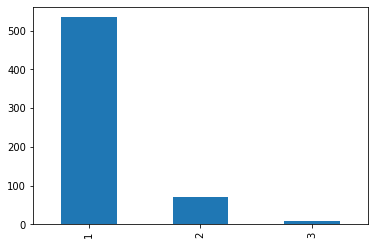

In [22]:
diff['dist'].value_counts(sort=False).plot('bar')

In [23]:
extremely_hard_examples = diff.query('dist>1')

In [24]:
extremely_hard_examples.shape

(80, 4)

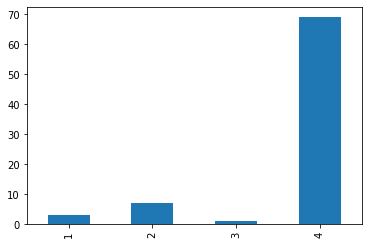

In [25]:
extremely_hard_examples['diagnosis'].value_counts(sort=False).plot('bar')

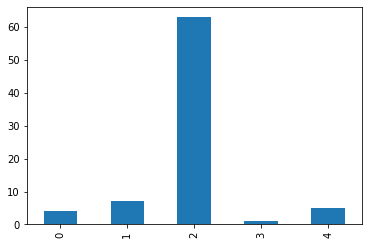

In [27]:
extremely_hard_examples['pred'].value_counts(sort=False).plot('bar')

In [28]:
excm = ConfusionMatrix(extremely_hard_examples['diagnosis'].values, extremely_hard_examples['pred'].values)
excm.print_matrix()

Predict  0        1        2        3        4        
Actual
0        0        0        0        0        0        

1        0        0        0        1        2        

2        4        0        0        0        3        

3        0        1        0        0        0        

4        0        6        63       0        0        




array([[1.76513638],
       [1.75543509],
       [2.01631596],
       [7.63718815],
       [2.90551548],
       [2.23670301],
       [2.21068735],
       [2.211766  ],
       [0.43021522],
       [2.29585271],
       [2.32143273],
       [2.4266623 ],
       [1.87198453],
       [2.08840513],
       [2.12908721],
       [1.27278142],
       [2.23326759],
       [1.52829924],
       [1.8833863 ],
       [2.19456162],
       [2.06743708],
       [1.99157395],
       [3.53144646],
       [2.28799129],
       [0.39123921],
       [2.3385344 ],
       [1.81064475],
       [1.95807862],
       [2.31468186],
       [1.82606845],
       [2.11767216],
       [1.78378537],
       [1.39111924],
       [2.47989869],
       [2.19269929],
       [2.42875605],
       [1.16713744],
       [2.4875042 ],
       [1.78642213],
       [2.41507125],
       [2.30966811],
       [2.19126091],
       [2.26728296],
       [2.33870068],
       [2.29225292],
       [1.29489627],
       [1.944524  ],
       [1.856

Extremely hard examples are from class 4, being predicted as 2, If I fix this issue, boi the score is gonna improve

###### Let's visualize these extremely hard examples

In [42]:
extremely_hard_examples.query('id_code == "262ad704319c.png"')

,id_code,diagnosis,pred,dist
535,262ad704319c.png,4,2,2


array([2.4266623])

(480, 640, 3)


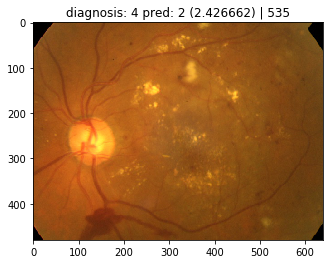

(2136, 3216, 3)


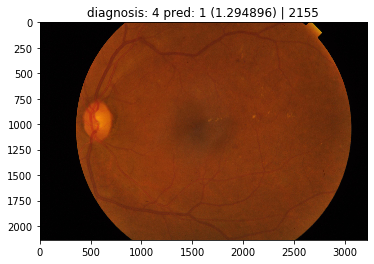

(2136, 3216, 3)


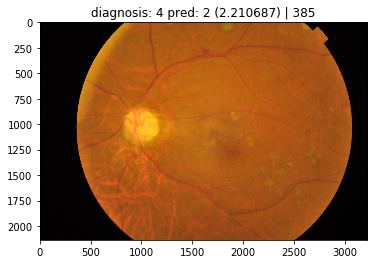

(1226, 1844, 3)


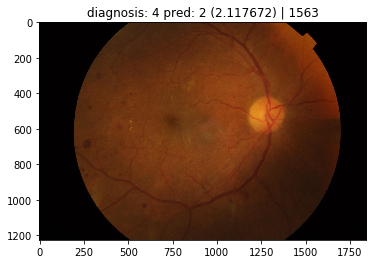

(1736, 2416, 3)


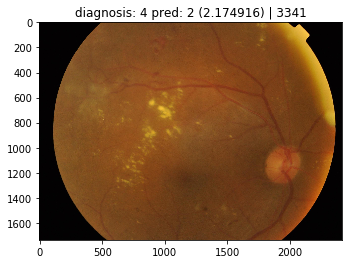

(1736, 2416, 3)


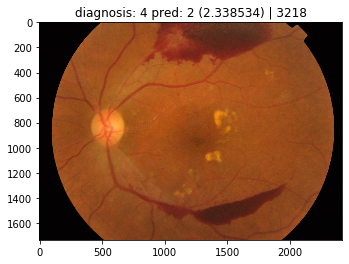

(1736, 2416, 3)


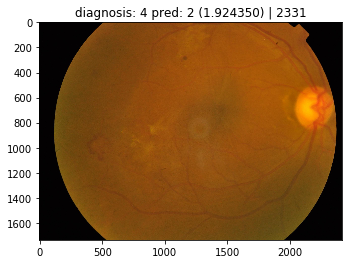

(1736, 2416, 3)


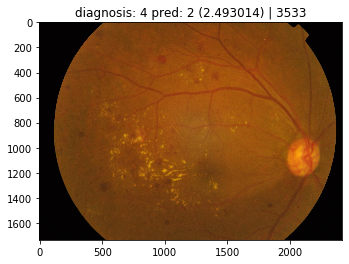

(1736, 2416, 3)


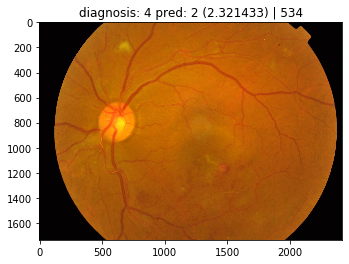

(1736, 2416, 3)


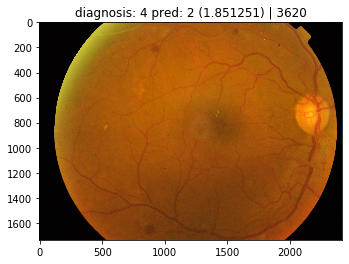

(1958, 2588, 3)


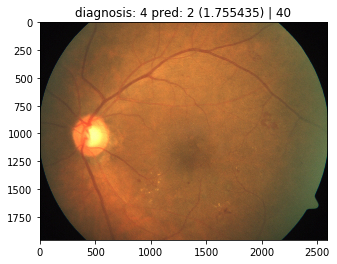

(1736, 2416, 3)


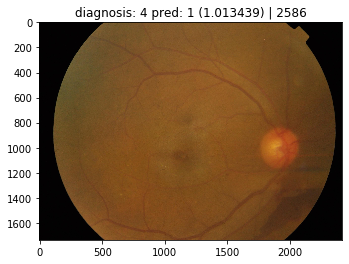

(1736, 2416, 3)


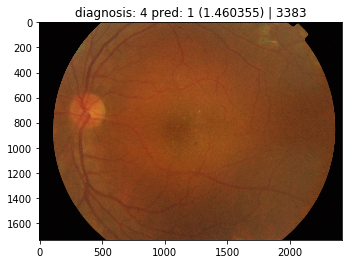

(1736, 2416, 3)


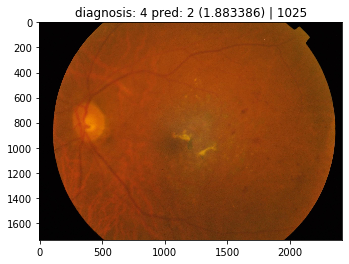

(1958, 2588, 3)


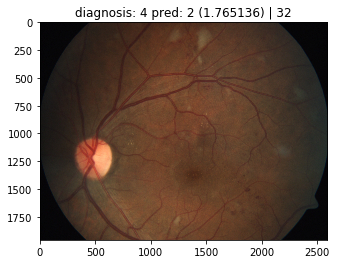

(2136, 3216, 3)


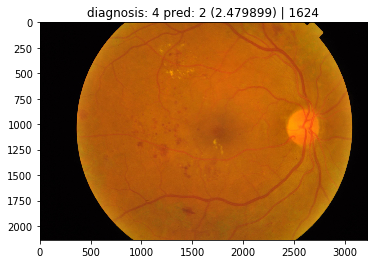

(1000, 1504, 3)


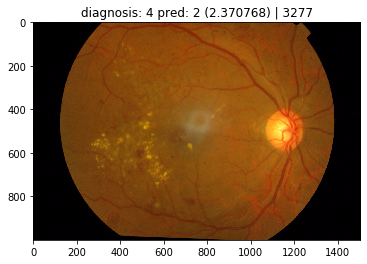

(1050, 1050, 3)


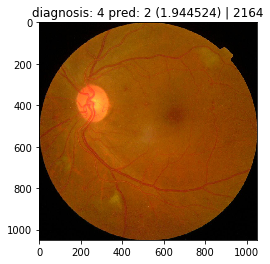

(1958, 2588, 3)


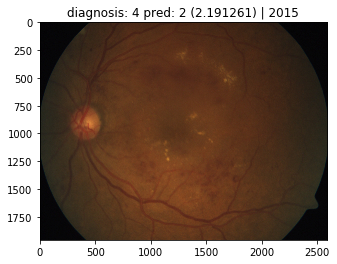

(1958, 2588, 3)


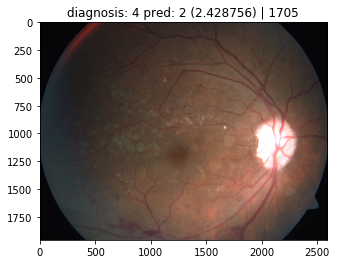

(1958, 2588, 3)


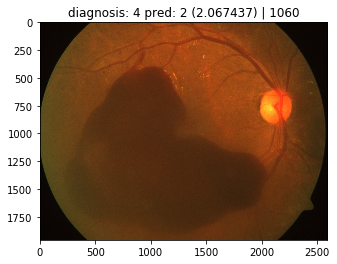

(1736, 2416, 3)


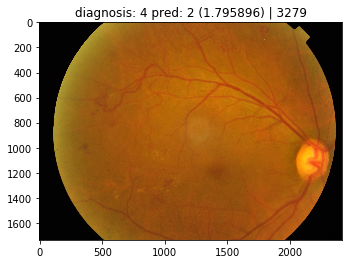

(1000, 1504, 3)


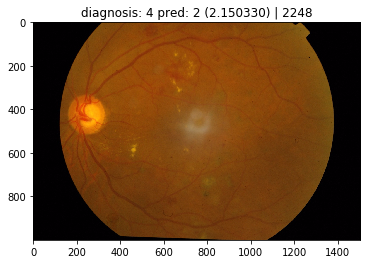

(2136, 3216, 3)


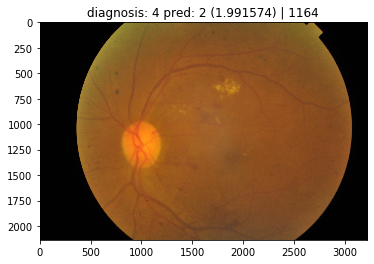

(2588, 3388, 3)


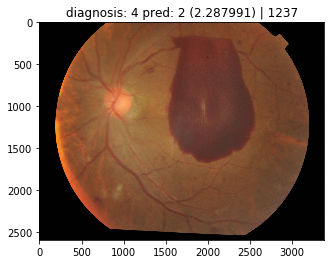

(2136, 3216, 3)


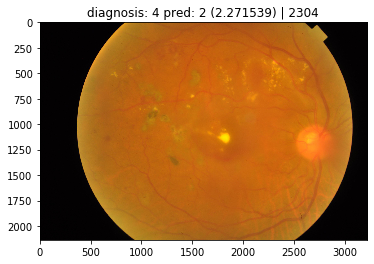

(1226, 1844, 3)


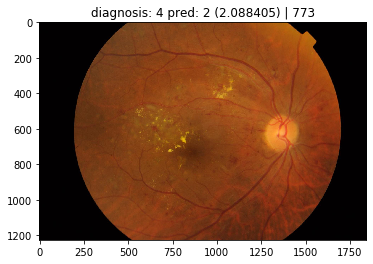

(1736, 2416, 3)


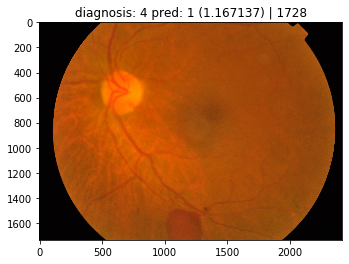

(1736, 2416, 3)


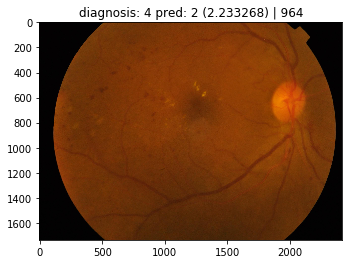

(2136, 3216, 3)


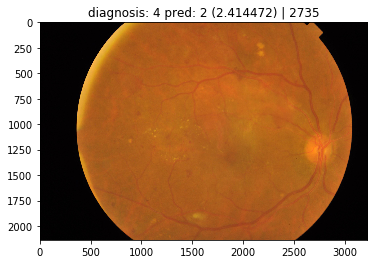

(2136, 3216, 3)


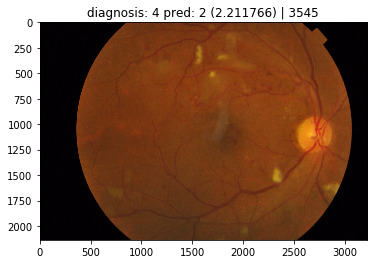

(2588, 3388, 3)


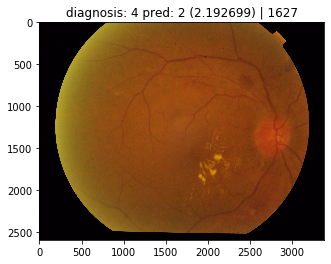

(1736, 2416, 3)


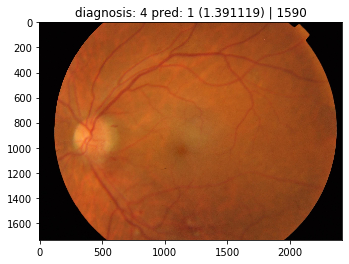

(1736, 2416, 3)


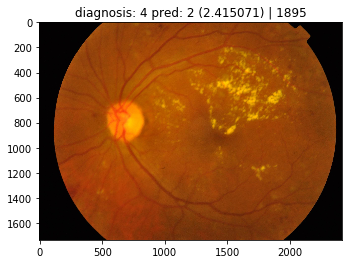

(2136, 3216, 3)


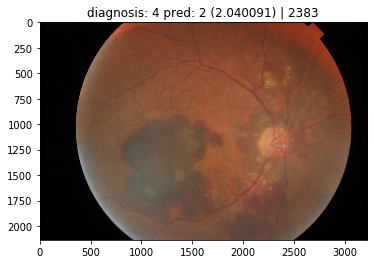

(2136, 3216, 3)


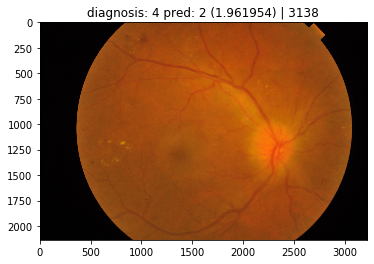

(2136, 3216, 3)


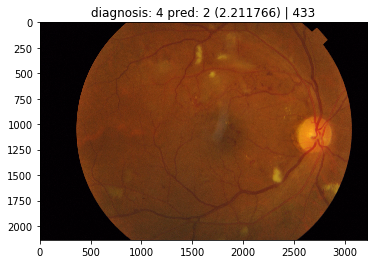

(2136, 3216, 3)


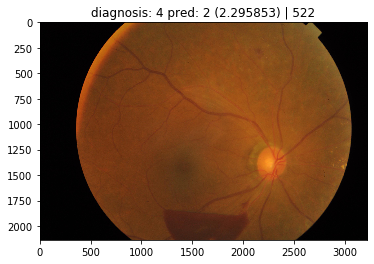

(2136, 3216, 3)


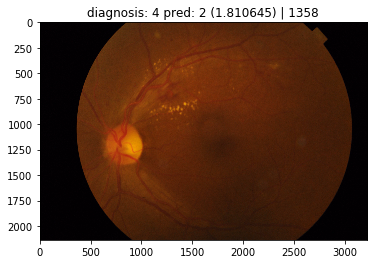

(2136, 3216, 3)


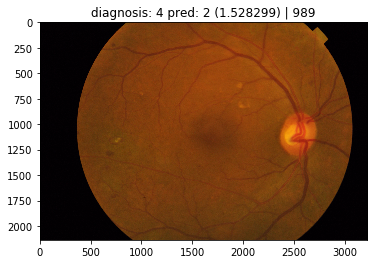

(2136, 3216, 3)


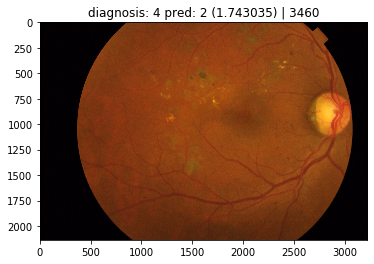

(2136, 3216, 3)


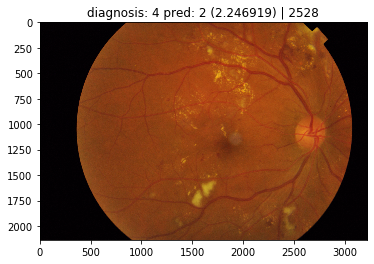

(2136, 3216, 3)


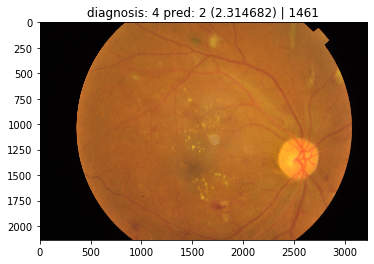

(2136, 3216, 3)


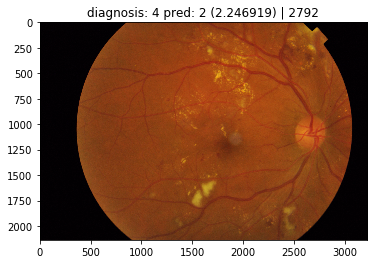

(1736, 2416, 3)


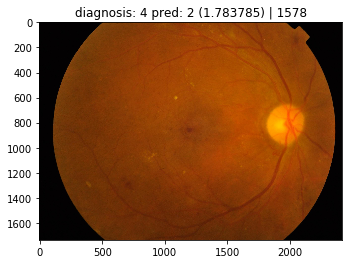

(2588, 3388, 3)


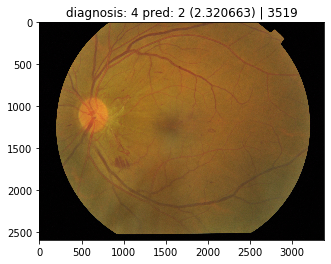

(2588, 3388, 3)


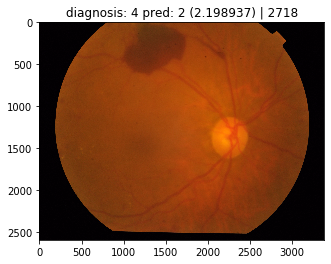

(1736, 2416, 3)


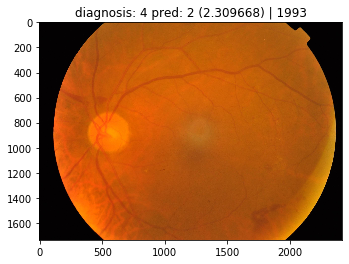

(1958, 2588, 3)


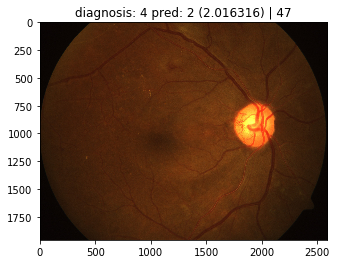

(2136, 3216, 3)


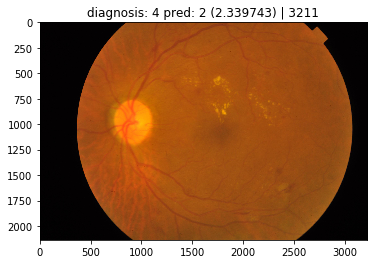

(1000, 1504, 3)


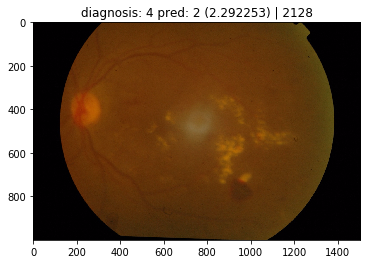

(1958, 2588, 3)


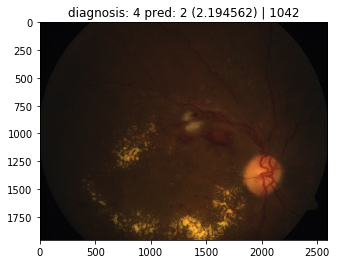

(2848, 4288, 3)


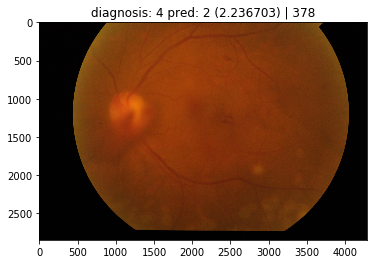

(1958, 2588, 3)


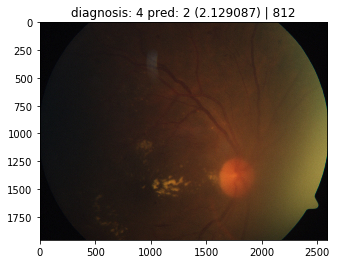

(2136, 3216, 3)


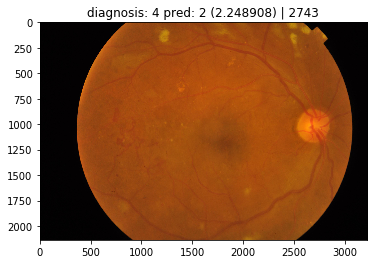

(1958, 2588, 3)


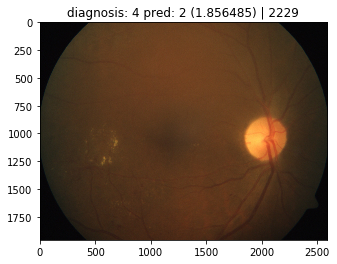

(2136, 3216, 3)


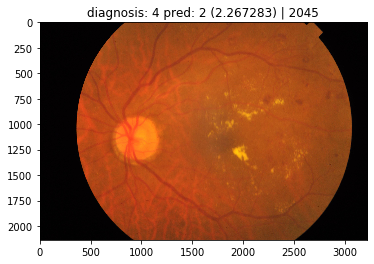

(1736, 2416, 3)


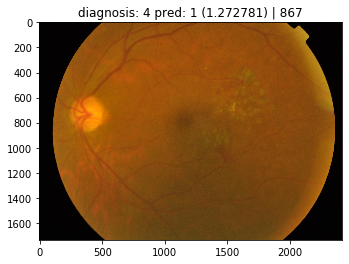

(2588, 3388, 3)


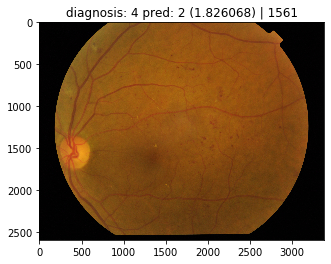

(2136, 3216, 3)


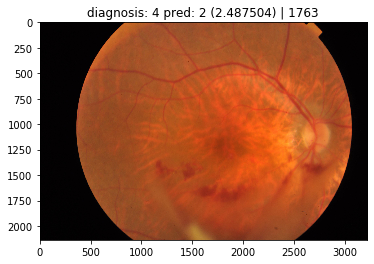

(2136, 3216, 3)


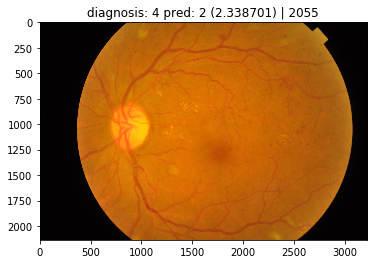

(1000, 1504, 3)


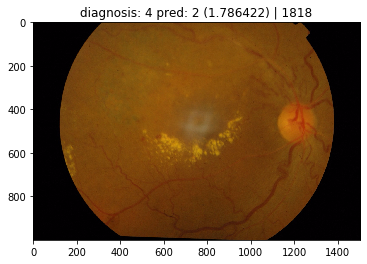

(2588, 3388, 3)


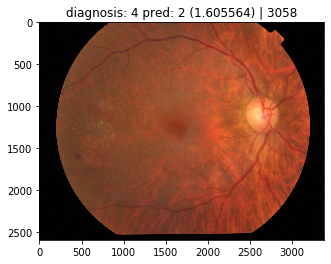

(2848, 4288, 3)


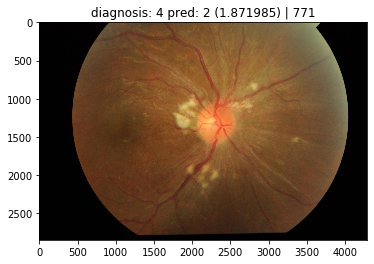

(2588, 3388, 3)


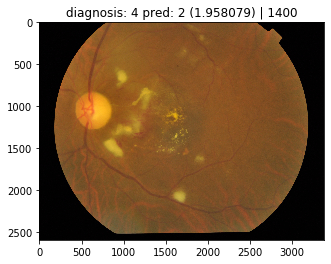

(2588, 3388, 3)


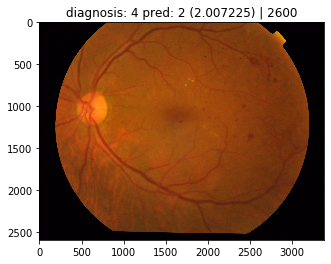

(1736, 2416, 3)


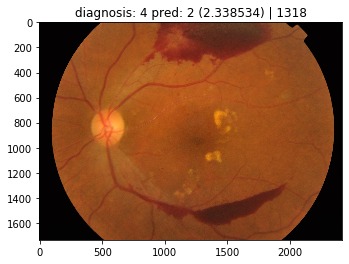

(2136, 3216, 3)


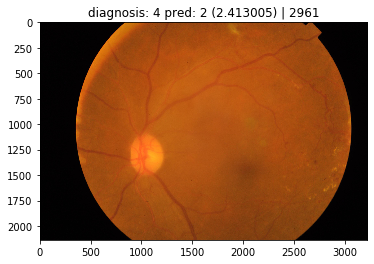

(1736, 2416, 3)


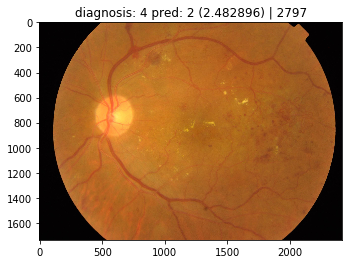

In [45]:
#fig = plt.figure(figsize=(25, 16))
IMG_SIZE=300
# for class_id in sorted(extremely_hard_examples['diagnosis'].unique()):
class_id = 4
samples = len(extremely_hard_examples[extremely_hard_examples['diagnosis'] == class_id])
for i, (idx, row) in enumerate(extremely_hard_examples.loc[extremely_hard_examples['diagnosis'] == class_id].sample(samples, random_state=69).iterrows()):
    path=f"../data/all_images/{row['id_code']}"
    image = cv2.imread(path)
    print(image.shape)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#     image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    #image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128) # the trick is to add this line
    plt.imshow(image)
    prob = mean_preds[idx]#[row.index.values]
    plt.title('diagnosis: %d pred: %d (%f) | %s' % (class_id, row['pred'], prob, idx) )
    plt.show()

In [89]:
#np.save('../data/extremely_hard_examples1.npy', extremely_hard_examples.index.values)

#ehe = np.load('../data/extremely_hard_examples1.npy')


In [50]:
blur_list = [ 170,  182,  212,  300,  374,  453,  541,  563,  574,  587,  668,
        677,  832,  921, 1029, 1043, 1071, 1075, 1173, 1178, 1233, 1310,
       1341, 1399, 1472, 1485, 1522, 1587, 1600, 1678, 1695, 1798, 1799,
       1800, 1817, 1882, 1979, 1996, 2047, 2054, 2123, 2223, 2319, 2341,
       2392, 2568, 2621, 2625, 2679, 2717, 2751, 2755, 2815, 2842, 2878,
       2924, 2995, 3004, 3024, 3102, 3174, 3196, 3237, 3346, 3375, 3527,
       3553, 3593, 3600, 3644, 3661]

In [57]:
#ehe = extremely_hard_examples.index.values
train_df.iloc[blur_list].query('dist>0')

,id_code,diagnosis,bestpred,basepred,dist
1310,5b301a6d1ac7,2,1,1,1
1485,681c3c115684,2,1,1,1
1587,6f4719c6bb4b,4,3,3,1
1996,8c0d05233238,3,4,3,1
2568,b191ba0a2b12,3,2,3,1
2621,b6304c545f95,2,1,1,1
3004,d15ca3469b87,2,1,1,1


In [71]:
bad_dup_list = np.load('../data/npy_files/bad_train_indices.npy') # the ones which have a duplicate with different diagnosis
print(len(bad_dup_list))
train_df.iloc[dup_list].query('dist>0')

79


,id_code,diagnosis,bestpred,basepred,dist
812,3a6e9730b298,4,2,2,2
952,4462fba1d2a1,4,3,3,1
1060,4bd941611343,4,2,1,2
1237,55eb405ec71e,4,3,3,1
1807,7f60f2a083d3,1,2,2,1
1957,89ed6a0dd53f,1,2,1,1
2041,8f318a978844,4,3,3,1
2343,a3fcf42ff56d,4,3,3,1
2618,b5c80d0ed0ff,2,3,3,1
2661,b87f9c59748b,4,2,3,2


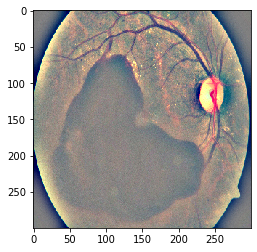

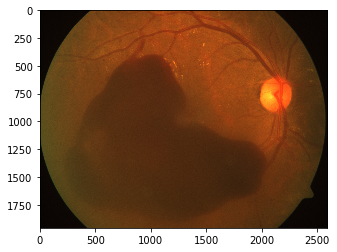

In [77]:
plt.imshow(np.load('../data/npy_files/bgcc300/4bd941611343.npy')); plt.show()
img = cv2.imread('../data/train_images/4bd941611343.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img); plt.show()

In [68]:
dup_with_samediag_list = np.load('../data/npy_files/dups_with_same_diagnosis.npy')
print(len(dup_with_samediag_list))
train_df.iloc[dup_with_samediag_list].query('dist>0')

219


,id_code,diagnosis,bestpred,basepred,dist
236,11242a67122d,4,3,3,1
433,1e9224ccca95,4,2,2,2
502,23d7ca170bdb,2,1,1,1
616,2b48daf24be0,3,2,2,1
679,3044022c6969,1,2,1,1
758,36677b70b1ef,1,2,2,1
1300,5a36cea278ae,2,1,1,1
1446,65c958379680,4,3,3,1
1580,6e92b1c5ac8e,3,2,2,1
1723,79ce83c07588,1,0,1,1


What's the for these getting incorrect predictions? were they in val set?

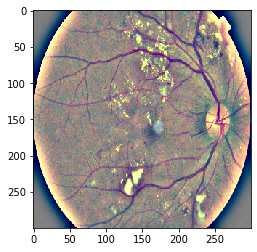

In [67]:
plt.imshow(np.load('../data/npy_files/bgcc300/c0e509786f7f.npy'))

In [52]:
len([x for x in blur_list if x in extremely_hard_examples.index.values])

0

In [57]:
#np.save('../data/hard_examples1.npy', best_diff.index.values)

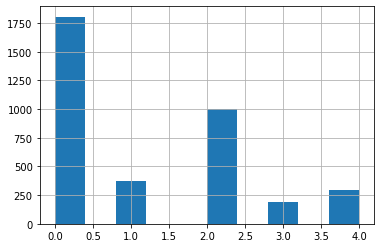

In [38]:
train_df['diagnosis'].hist()

### Why is there so much variation in the test predictions?

In [52]:
# let's generate multiple test predictions from a same model

In [171]:
test0, best_thresholds = np.load('../weights/23-7_efficientnet-b5_fold1_po3005e-6/test_npy/test_ckpt28_0.npy')
test = {
    0: test0
}
for i in range(1, 5):
    test[i] = np.load(f'../weights/23-7_efficientnet-b5_fold1_po3005e-6/test_npy/test_ckpt28_{1}.npy')[0]

In [172]:
pred = {}
for i in range(5):
    pred[i] = predict(test[i], best_thresholds)

In [173]:
df = pd.DataFrame()

In [174]:
for i in range(5):
    df[f'pred{i}'] = pred[i].reshape(-1)

In [175]:
df.head()

,pred0,pred1,pred2,pred3,pred4
0,2,2,2,2,2
1,3,3,3,3,3
2,3,3,3,3,3
3,2,2,2,2,2
4,2,2,2,2,2


In [176]:
df.query('pred0 == pred1 == pred2 == pred3 == pred4').shape, df.shape

((1861, 5), (1928, 5))

with tta=2: 1928 - 1824 = 104 cases are varying. 0:55
#with tta=4: 99 cases are varying. 1:22
#with tta=5: 89 cases are varying. 1:22
#with tta=6: 76 cases are varying. 1:48 minutes per epoch
#with tta=6: 94 cases are varying. 1:48 minutes per epoch
#with tta=8: 88 cases are varying. 2:15 minutes per epoch
#with tta=10: 67
#with no tta, got ZERO variation, all predictions were same

### Analyse best submissions

In [80]:
# y1 = pd.read_csv('../weights/submission796.csv')
y2 = pd.read_csv('../weights/submission812.csv')
y3 = pd.read_csv('../weights/submission820.csv')

y = pd.DataFrame()
y['id_code'] = y2['id_code']
y['y2'] = y2['diagnosis']
y['y3'] = y3['diagnosis']
y['dist'] = abs(y['y3'] - y['y2'])
y.head()

,id_code,y2,y3,dist
0,0005cfc8afb6,1,2,1
1,003f0afdcd15,3,3,0
2,006efc72b638,2,2,0
3,00836aaacf06,2,2,0
4,009245722fa4,2,2,0


In [82]:
diff = y.query('dist>0')

In [95]:
diff.shape, y.shape, 100 * diff.shape[0] / y.shape[0] # percentage

((152, 4), (1928, 4), 7.8838174273858925)

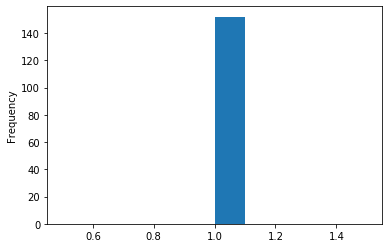

In [96]:
diff.dist.plot(kind='hist') # mostly are 1 label apart

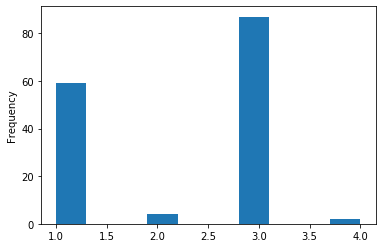

In [88]:
diff.y2.plot(kind='hist')

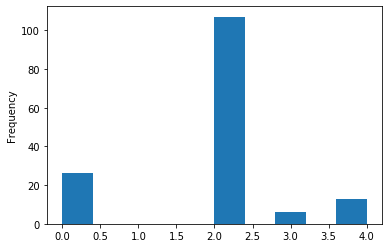

In [89]:
diff.y3.plot(kind='hist')

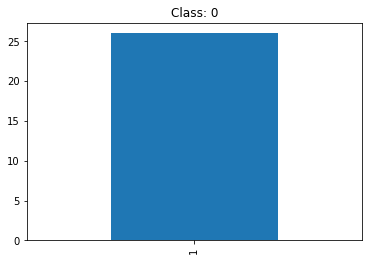

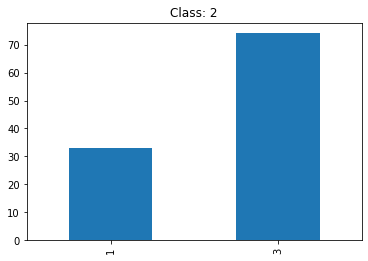

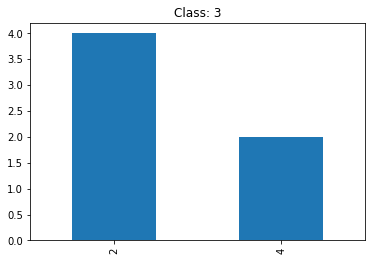

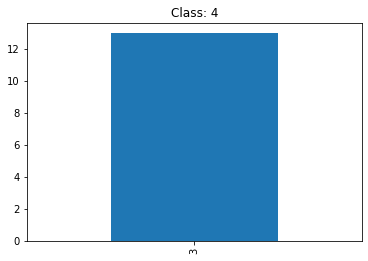

In [93]:
# taking y3 as ground truth, how is y1 varying
for i in range(5): 
    try:
        diff[diff['y3']==i]['y2'].value_counts(sort=False).plot(kind="bar", title=f'Class: {i}'); plt.show()
    except:
        pass

### test

In [66]:
tdf = pd.read_csv('../weights/168_efficientnet-b5_f0_poma/train.csv')
vdf = pd.read_csv('../weights/168_efficientnet-b5_f0_poma/val.csv')

t0 = pd.read_csv('../data/folds/train0-5.csv')
v0 = pd.read_csv('../data/folds/val0-5.csv')
t0['id_code'] = t0['id_code'] + '.png'
v0['id_code'] = v0['id_code'] + '.png'

In [68]:
tdf.shape, t0.shape, vdf.shape, v0.shape

((2775, 3), (2775, 3), (696, 3), (696, 3))

In [69]:
tdf.head()

,id_code,diagnosis,weight
0,000c1434d8d7.png,2,1
1,001639a390f0.png,4,1
2,0024cdab0c1e.png,1,1
3,005b95c28852.png,0,1
4,0083ee8054ee.png,4,1


In [71]:
tdf[tdf['id_code'] == t0['id_code']].shape

(2775, 3)

In [72]:
vdf[vdf['id_code'] == v0['id_code']].shape

(696, 3)

In [75]:
v0[v0['id_code'] == v1['id_code']].shape

(0, 3)

### CV

In [14]:
path = '../weights/ensemble/168_efficientnet-b5_poma/'
raw_train = np.load(os.path.join(path + 'train.npy'))
df = pd.read_csv('../data/train.csv')

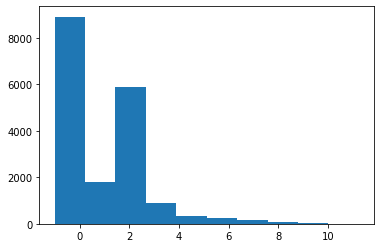

In [15]:
plt.hist(train.flatten());

In [79]:
train_df['label'] = train_df.diagnosis.apply(lambda x: 1 if x == 4 else 0)

In [80]:
train_df.head()

,id_code,diagnosis,basepred,label
0,000c1434d8d7.png,2,2,0
1,001639a390f0.png,4,4,1
2,0024cdab0c1e.png,1,0,0
3,002c21358ce6.png,0,0,0
4,005b95c28852.png,0,0,0
